##### データセットの場所やバッチサイズなどの定数値の設定

In [1]:
import os
os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'
import torch


# 前回の試行の続きを行いたい場合は True にする -> 再開モードになる．
# なお，Colab環境で再開モードを利用する場合は，前回終了時に temp ディレクトリの中身を自分の Google Drive に退避しておき，
# それを改めて /content/AI_advanced/temp 以下にあらかじめ移しておく必要がある．
RESTART_MODE = False

DEVICE = 'cuda:0'

# 高速化・省メモリ化のために半精度小数を用いた混合精度学習を行うか否か（Trueの場合は行う）
USE_AMP = True
FLOAT_DTYPE = torch.float16 # 混合精度学習を行う場合の半精度小数の型．環境によっては torch.bfloat16 にした方が良好な性能になる（ただしColabのT4 GPU環境ではムリ）．

# 混合精度学習の設定
if DEVICE == 'cpu':
    USE_AMP = False # CPU使用時は強制的に混合精度学習をOFFにする
LOSS_SCALER = torch.amp.grad_scaler.GradScaler(enabled=USE_AMP, device='cuda', init_scale=2**16)
ADAM_EPS = 1e-4 if USE_AMP and (FLOAT_DTYPE == torch.float16) else 1e-8

# 全ての訓練データを一回ずつ使用することを「1エポック」として，何エポック分学習するか
# 再開モードの場合も, このエポック数の分だけ追加学習される（N_EPOCHSは最終エポック番号ではない）
N_EPOCHS = 20

# 学習時のバッチサイズ
BATCH_SIZE = 100

# データセットの存在するフォルダ・ファイル名
DATA_DIR = './data/CelebA'
TRAIN_IMAGES_FILE = 'tinyCelebA_train_images.pt'
VALID_IMAGES_FILE = 'tinyCelebA_valid_images.pt'

# 画像サイズ

H = 128 # 縦幅
W = 128 # 横幅
C = 3 # チャンネル数（カラー画像なら3，グレースケール画像なら1）

# 特徴ベクトルの次元数
N = 128

# 学習結果の保存先フォルダ
MODEL_DIR = './models/Celeb/AE'

# 学習結果のニューラルネットワークの保存先
MODEL_FILE_ENC = os.path.join(MODEL_DIR, f'{N}_encoder.pth') # エンコーダ
MODEL_FILE_DEC = os.path.join(MODEL_DIR, f'{N}_decoder.pth') # デコーダ

# 中断／再開の際に用いる一時ファイルの保存先
CHECKPOINT_EPOCH = os.path.join('./temp/', 'checkpoint_epoch.pkl')
CHECKPOINT_ENC_MODEL = os.path.join('./temp/', 'checkpoint_enc_model.pth')
CHECKPOINT_DEC_MODEL = os.path.join('./temp/', 'checkpoint_dec_model.pth')
CHECKPOINT_ENC_OPT = os.path.join('./temp/', 'checkpoint_enc_opt.pth')
CHECKPOINT_DEC_OPT = os.path.join('./temp/', 'checkpoint_dec_opt.pth')

##### ニューラルネットワークモデルの定義

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F


# Residual Block
# 入力特徴マップと出力特徴マップのチャンネル数は同一であることを前提とする
class ResBlock(nn.Module):
    def __init__(self, channels, kernel_size, stride, padding, activation=F.relu):
        super(ResBlock, self).__init__()
        self.activation = activation
        self.conv1 = nn.Conv2d(in_channels=channels, out_channels=channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.conv2 = nn.Conv2d(in_channels=channels, out_channels=channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.bn1 = nn.BatchNorm2d(num_features=channels)
        self.bn2 = nn.BatchNorm2d(num_features=channels)
    def forward(self, x):
        h = self.activation(self.bn1(self.conv1(x)))
        h = self.bn2(self.conv2(h))
        return self.activation(h + x)


# 顔画像を N 次元の特徴ベクトルへと圧縮するニューラルネットワーク
# AutoEncoderのエンコーダ部分のサンプル
class FaceEncoder(nn.Module):

    # C: 入力顔画像のチャンネル数（1または3と仮定）
    # H: 入力顔画像の縦幅（8の倍数と仮定）
    # W: 入力顔画像の横幅（8の倍数と仮定）
    # N: 出力の特徴ベクトルの次元数
    def __init__(self, C, H, W, N):
        super(FaceEncoder, self).__init__()

        # 畳込み層1～3
        # カーネルサイズ4，ストライド幅2，パディング1の設定なので，これらを通すことにより特徴マップの縦幅・横幅がそれぞれ 1/2 になる
        # 3つ適用することになるので，最終的には都合 1/8 になる -> ゆえに，入力顔画像の縦幅と横幅を各々8の倍数と仮定している
        self.conv1 = nn.Conv2d(in_channels=C, out_channels=16, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=4, stride=2, padding=1)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=4, stride=2, padding=1)

        # 畳込み層4
        # カーネルサイズ3，ストライド幅1，パディング1の設定なので，これを通しても特徴マップの縦幅・横幅は変化しない
        self.conv4 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1)
        #self.conv4 = ResBlock(channels=64, kernel_size=3, stride=1, padding=1) # 例: Residual Block を使用する場合はこのように記載

        # バッチ正規化層
        self.bn1 = nn.BatchNorm2d(num_features=16)
        self.bn2 = nn.BatchNorm2d(num_features=32)
        self.bn3 = nn.BatchNorm2d(num_features=64)
        self.bn4 = nn.BatchNorm2d(num_features=64)

        # 平坦化
        self.flat = nn.Flatten()

        # 全結合層1
        # 畳込み層1～3を通すことにより特徴マップの縦幅・横幅は都合 1/8 になっている．
        # その後，さらに self.conv4 を通してから全結合層を適用する予定なので，入力側のユニット数は 64*(H/8)*(W/8) = H*W
        self.fc1 = nn.Linear(in_features=H*W, out_features=2048)

        # 全結合層2
        self.fc2 = nn.Linear(in_features=2048, out_features=N)

    def forward(self, x):
        h = F.leaky_relu(self.bn1(self.conv1(x)))
        h = F.leaky_relu(self.bn2(self.conv2(h)))
        h = F.leaky_relu(self.bn3(self.conv3(h)))
        h = F.leaky_relu(self.bn4(self.conv4(h)))
        #h = self.conv4(h) # 例: Residual Block を使用する場合はこのように記載（Residual Blockの内部でバッチ正規化と活性化関数を適用しているので，外側では適用しない）
        h = self.flat(h)
        h = F.leaky_relu(self.fc1(h))
        z = self.fc2(h)
        return z


# N 次元の特徴ベクトルから顔画像を生成するニューラルネットワーク
# AutoEncoderのデコーダ部分のサンプル
class FaceDecoder(nn.Module):

    # C: 出力顔画像のチャンネル数（1または3と仮定）
    # H: 出力顔画像の縦幅（8の倍数と仮定）
    # W: 出力顔画像の横幅（8の倍数と仮定）
    # N: 入力の特徴ベクトルの次元数
    def __init__(self, C, H, W, N):
        super(FaceDecoder, self).__init__()
        self.W = W
        self.H = H

        # 全結合層1,2
        # パーセプトロン数は FaceEncoder の全結合層と真逆に設定
        self.fc2 = nn.Linear(in_features=N, out_features=2048)
        self.fc1 = nn.Linear(in_features=2048, out_features=H*W)

        # 転置畳込み層1～4
        # カーネルサイズ，ストライド幅，パディングは FaceEncoder の畳込み層1～4と真逆に設定
        self.deconv4 = nn.ConvTranspose2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1)
        self.deconv3 = nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=4, stride=2, padding=1)
        self.deconv2 = nn.ConvTranspose2d(in_channels=32, out_channels=16, kernel_size=4, stride=2, padding=1)
        self.deconv1 = nn.ConvTranspose2d(in_channels=16, out_channels=8, kernel_size=4, stride=2, padding=1)

        # バッチ正規化層
        self.bn4 = nn.BatchNorm2d(num_features=64)
        self.bn3 = nn.BatchNorm2d(num_features=32)
        self.bn2 = nn.BatchNorm2d(num_features=16)
        self.bn1 = nn.BatchNorm2d(num_features=8)

        # 畳込み層
        # 転置畳込み層の出力には checker board artifact というノイズが乗りやすいので，最後に畳込み層を通しておく
        self.conv = nn.Conv2d(in_channels=8, out_channels=C, kernel_size=3, stride=1, padding=1)

    def forward(self, z):
        h = F.leaky_relu(self.fc2(z))
        h = F.leaky_relu(self.fc1(h))
        h = torch.reshape(h, (len(h), 64, self.H//8, self.W//8)) # 一列に並んだユニットを 64*(H/8)*(W/8) の特徴マップに並べ直す
        h = F.leaky_relu(self.bn4(self.deconv4(h)))
        h = F.leaky_relu(self.bn3(self.deconv3(h)))
        h = F.leaky_relu(self.bn2(self.deconv2(h)))
        h = F.leaky_relu(self.bn1(self.deconv1(h)))
        y = torch.sigmoid(self.conv(h))
        return y

##### 訓練データセットの読み込み

In [4]:
import torch
from torch.utils.data import DataLoader, random_split
from src.utils.data_io import TensorDataset


# 再開モードの場合は，前回使用したデータセットをロードして使用する
if RESTART_MODE:

    # テンソルファイルを読み込み，前回使用したデータセットを用意
    train_dataset = TensorDataset(filenames=[
        os.path.join('./temp/', TRAIN_IMAGES_FILE)
    ])
    valid_dataset = TensorDataset(filenames=[
        os.path.join('./temp/', VALID_IMAGES_FILE)
    ])
    train_size = len(train_dataset)
    valid_size = len(valid_dataset)

# そうでない場合は，新たにデータセットを読み込む
else:

    # テンソルファイルを読み込み, 訓練データセットを用意
    dataset = TensorDataset(filenames=[
        os.path.join(DATA_DIR, TRAIN_IMAGES_FILE)
    ])

    # 訓練データセットを分割し，一方を検証用に回す
    dataset_size = len(dataset)
    valid_size = int(0.002 * dataset_size) # 全体の 0.2% を検証用に -> tinyCelebA の画像は全部で 16000 枚なので，検証用画像は 16000*0.002=32 枚
    train_size = dataset_size - valid_size # 残りの 99.8% を学習用に
    train_dataset, valid_dataset = random_split(dataset, [train_size, valid_size])

    # データセット情報をファイルに保存
    torch.save(torch.cat([torch.unsqueeze(train_dataset[i], dim=0) for i in range(len(train_dataset))], dim=0), os.path.join('./temp/', TRAIN_IMAGES_FILE))
    torch.save(torch.cat([torch.unsqueeze(valid_dataset[i], dim=0) for i in range(len(valid_dataset))], dim=0), os.path.join('./temp/', VALID_IMAGES_FILE))


# 訓練データおよび検証用データをミニバッチに分けて使用するための「データローダ」を用意
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, pin_memory=True, num_workers=8)
valid_dataloader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=False, pin_memory=True, num_workers=8)

##### 学習処理の実行

Epoch 1:


100%|██████████| 160/160 [00:17<00:00,  9.10it/s]


train loss = 0.033349


100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


valid loss = 0.018099



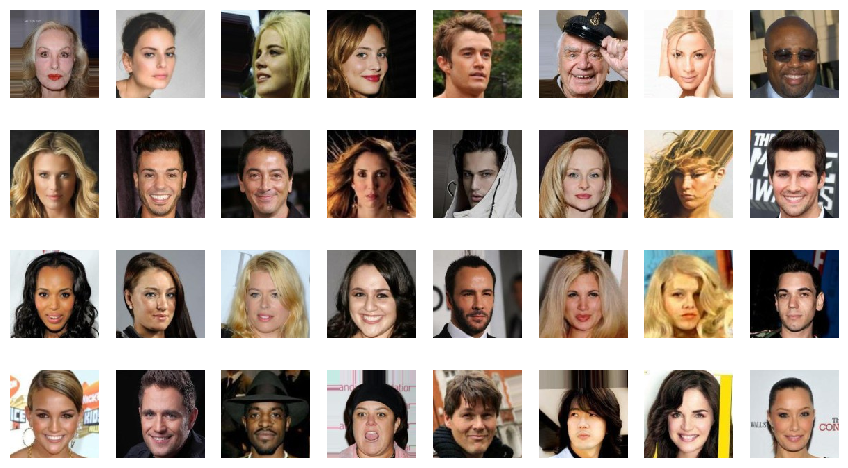

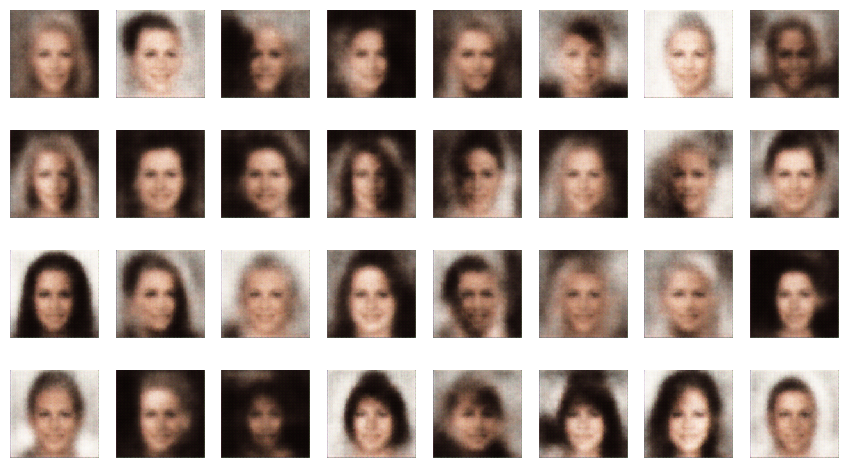

Epoch 2:


100%|██████████| 160/160 [00:15<00:00, 10.06it/s]


train loss = 0.016433


100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


valid loss = 0.014644



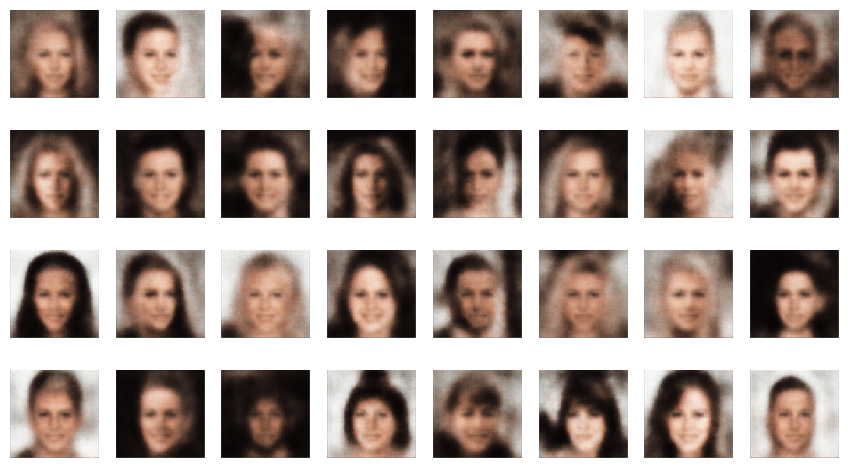

Epoch 3:


100%|██████████| 160/160 [00:16<00:00,  9.84it/s]


train loss = 0.014247


100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


valid loss = 0.013174



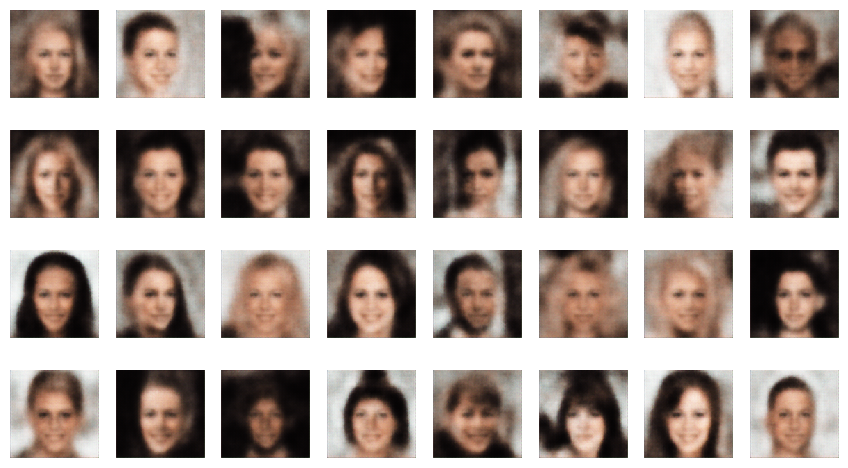

Epoch 4:


100%|██████████| 160/160 [00:16<00:00,  9.89it/s]


train loss = 0.012374


100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


valid loss = 0.011521



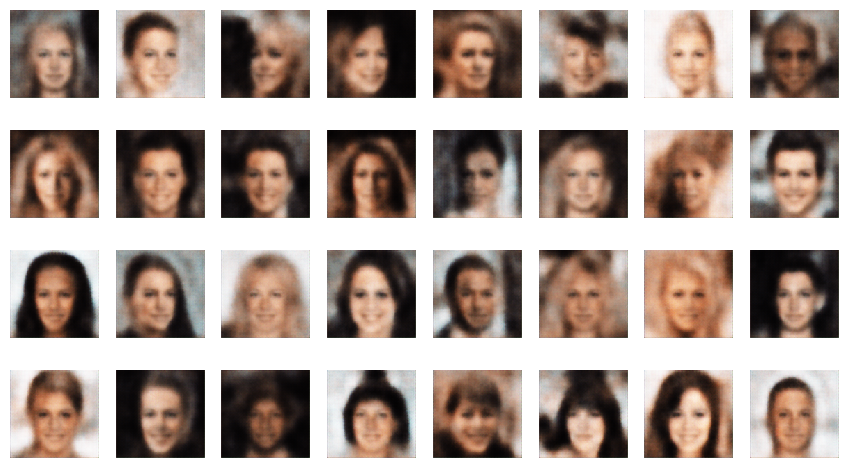

Epoch 5:


100%|██████████| 160/160 [00:16<00:00,  9.89it/s]


train loss = 0.010977


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


valid loss = 0.011109



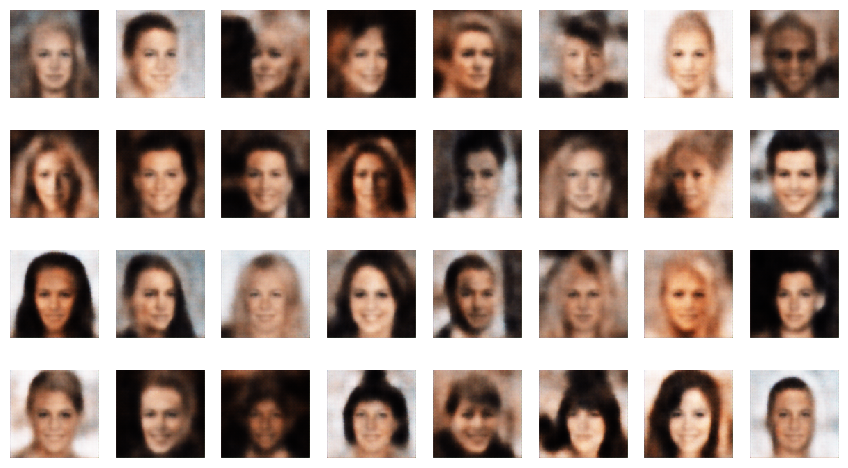

Epoch 6:


100%|██████████| 160/160 [00:16<00:00,  9.75it/s]


train loss = 0.010351


100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


valid loss = 0.011172



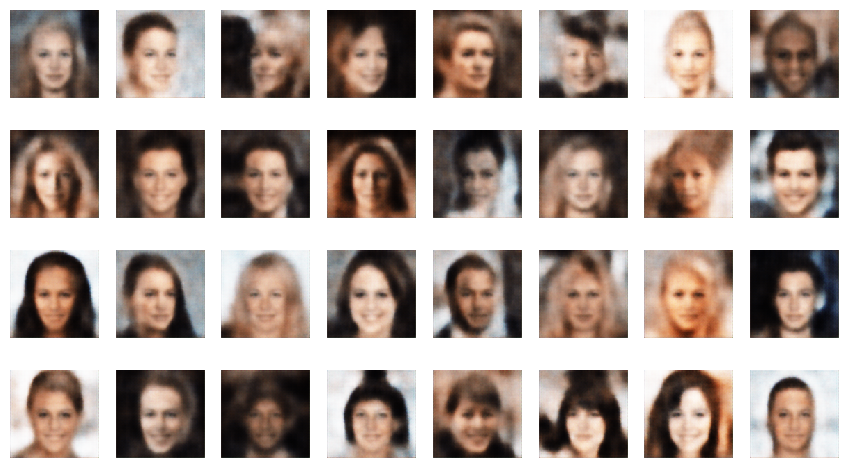

Epoch 7:


100%|██████████| 160/160 [00:16<00:00,  9.84it/s]


train loss = 0.009698


100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


valid loss = 0.010085



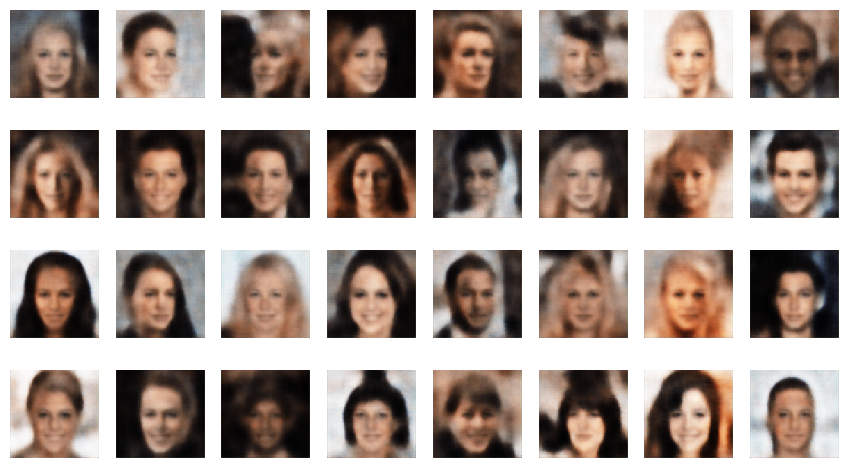

Epoch 8:


100%|██████████| 160/160 [00:16<00:00,  9.79it/s]


train loss = 0.009403


100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


valid loss = 0.009630



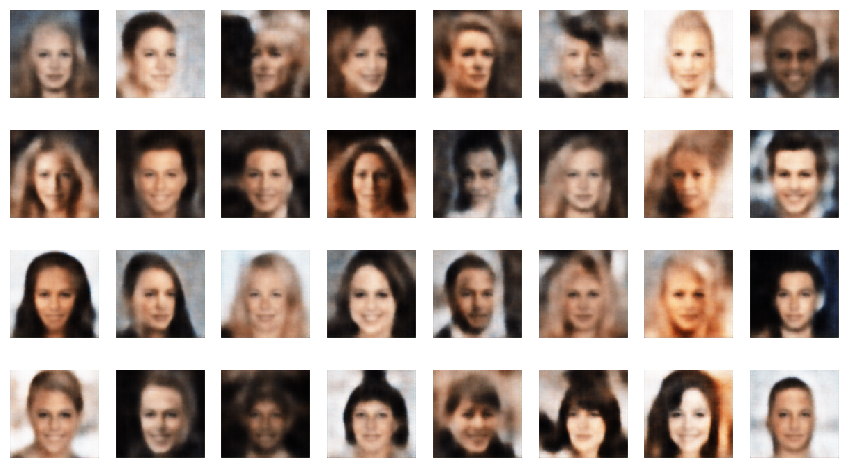

Epoch 9:


100%|██████████| 160/160 [00:16<00:00,  9.79it/s]


train loss = 0.009020


100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


valid loss = 0.009728



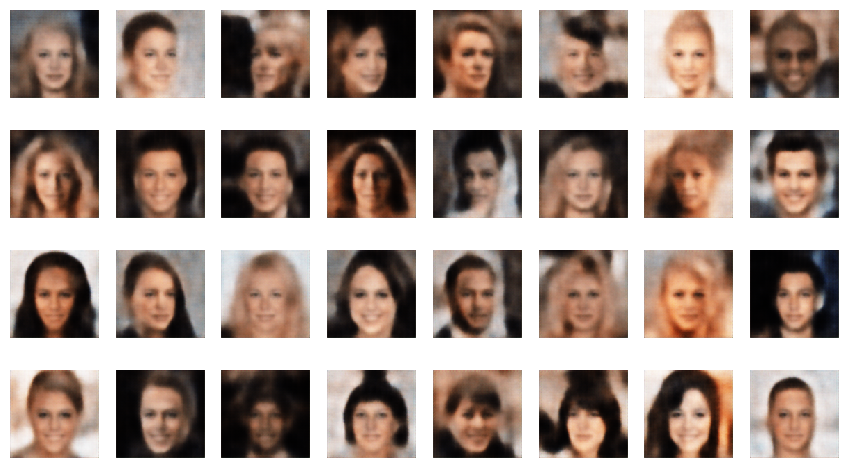

Epoch 10:


100%|██████████| 160/160 [00:16<00:00,  9.78it/s]


train loss = 0.008680


100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


valid loss = 0.009064



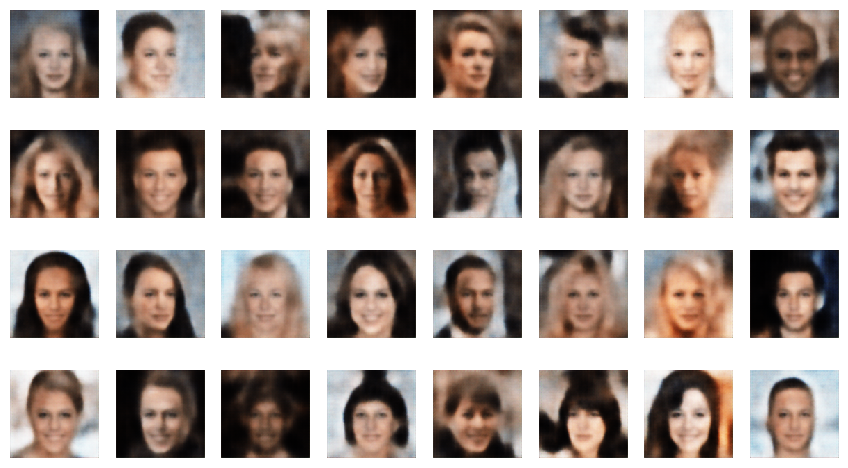

Epoch 11:


100%|██████████| 160/160 [00:16<00:00,  9.77it/s]


train loss = 0.008535


100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


valid loss = 0.008650



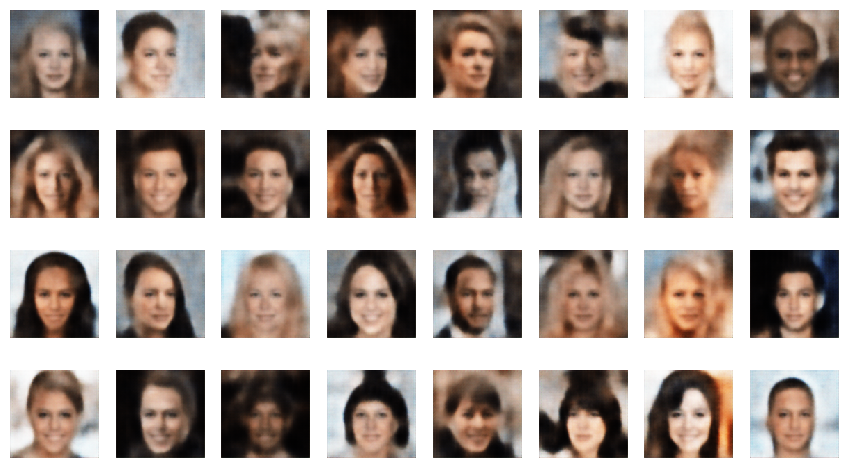

Epoch 12:


100%|██████████| 160/160 [00:16<00:00,  9.86it/s]


train loss = 0.008363


100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


valid loss = 0.008707



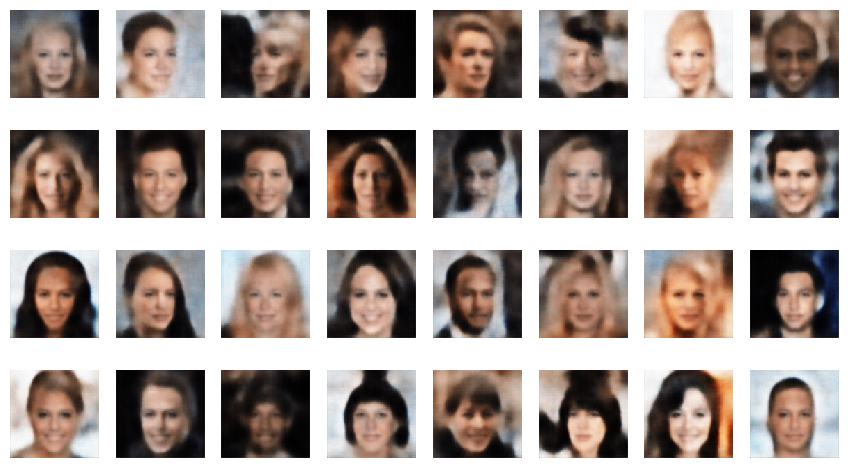

Epoch 13:


100%|██████████| 160/160 [00:16<00:00,  9.82it/s]


train loss = 0.008227


100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


valid loss = 0.009064



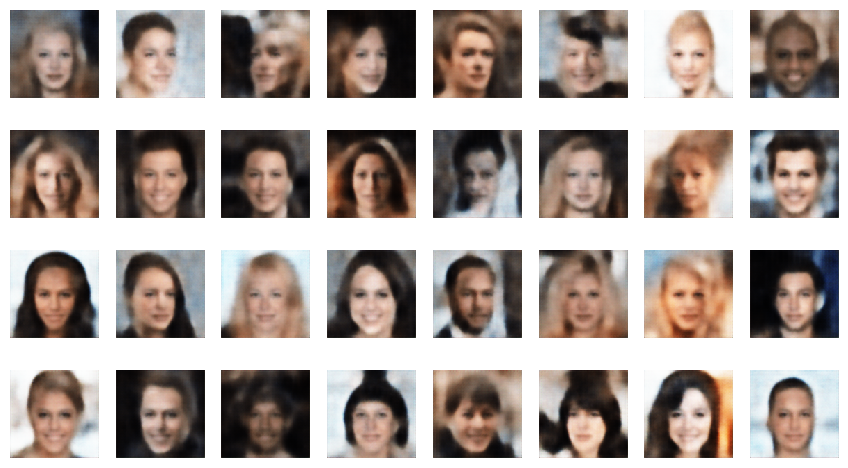

Epoch 14:


100%|██████████| 160/160 [00:16<00:00,  9.82it/s]


train loss = 0.008022


100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


valid loss = 0.008187



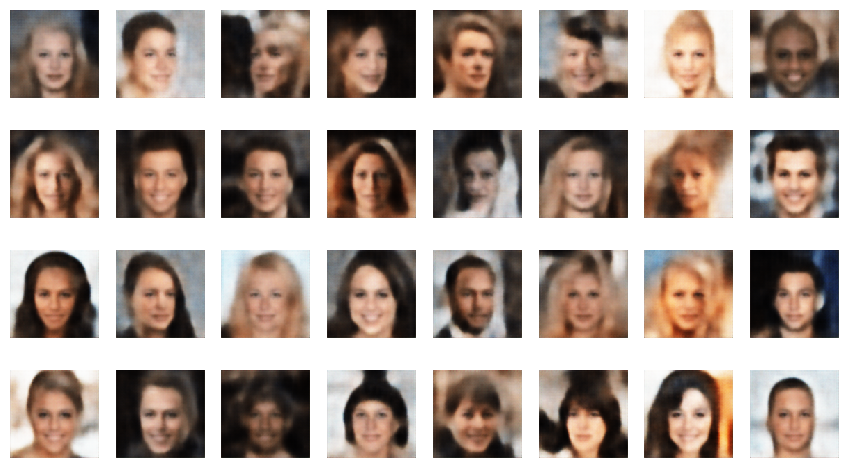

Epoch 15:


100%|██████████| 160/160 [00:16<00:00,  9.82it/s]


train loss = 0.007895


100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


valid loss = 0.008674



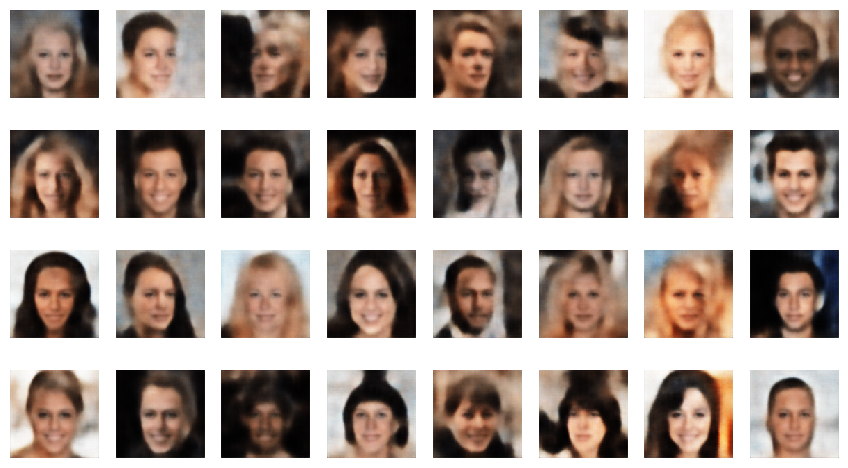

Epoch 16:


100%|██████████| 160/160 [00:16<00:00,  9.78it/s]


train loss = 0.007830


100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


valid loss = 0.008641



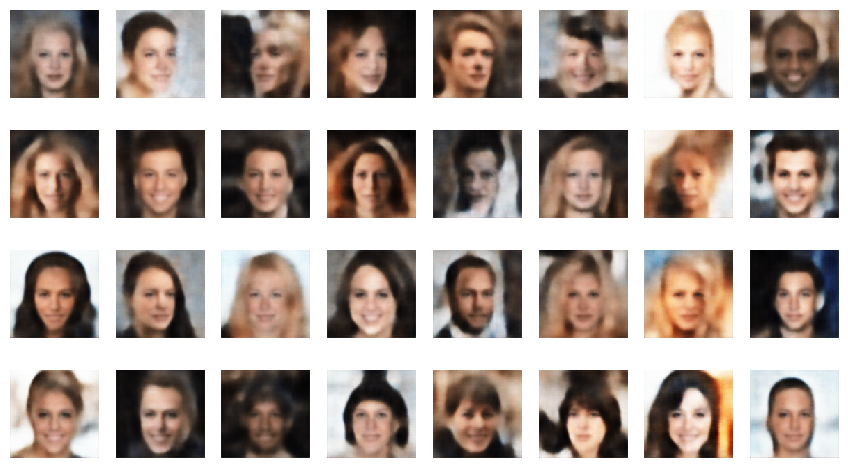

Epoch 17:


100%|██████████| 160/160 [00:16<00:00,  9.73it/s]


train loss = 0.007767


100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


valid loss = 0.008145



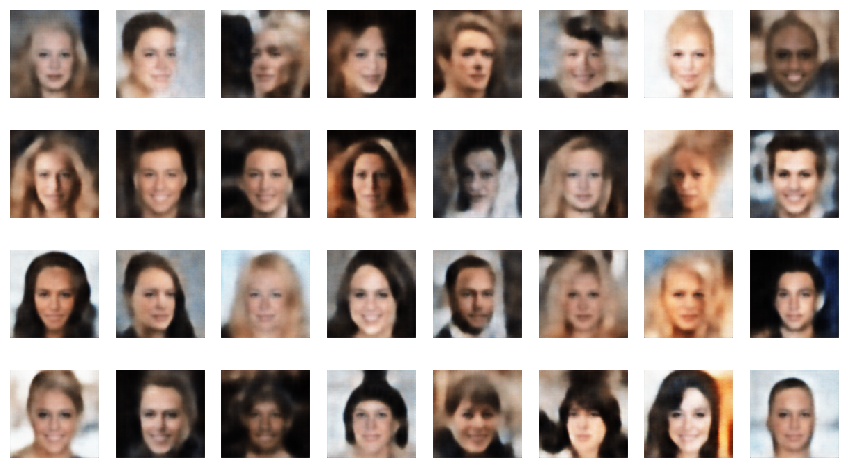

Epoch 18:


100%|██████████| 160/160 [00:16<00:00,  9.75it/s]


train loss = 0.007548


100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid loss = 0.008390



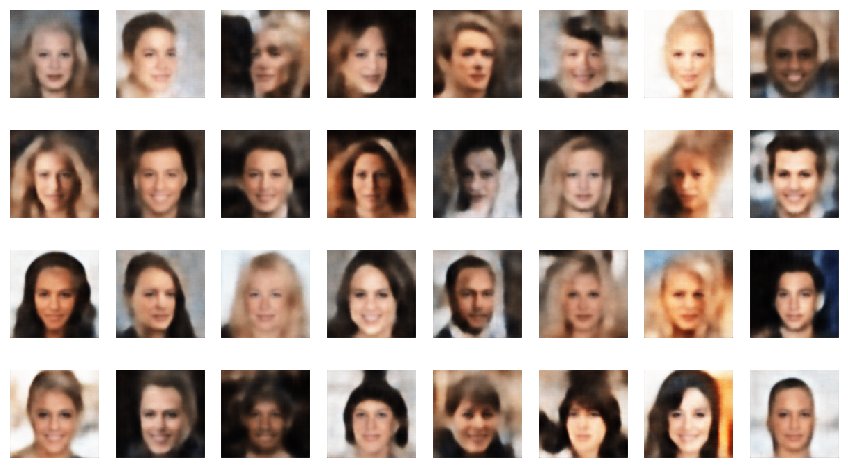

Epoch 19:


100%|██████████| 160/160 [00:16<00:00,  9.67it/s]


train loss = 0.007459


100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


valid loss = 0.007669



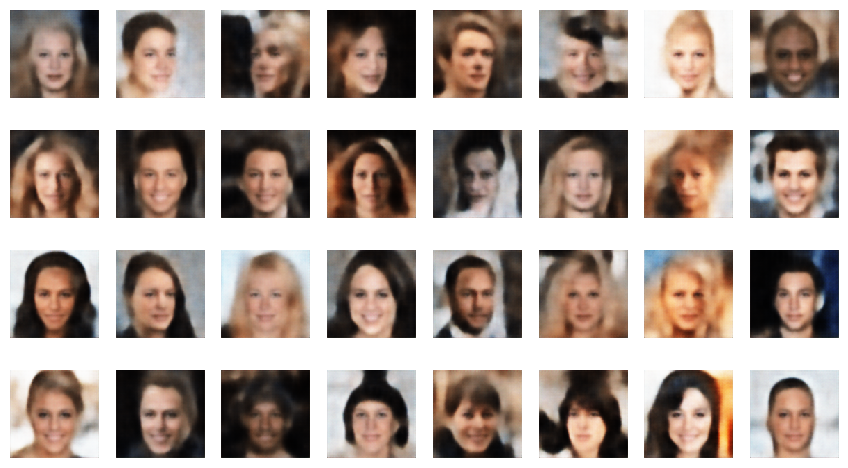

Epoch 20:


100%|██████████| 160/160 [00:16<00:00,  9.76it/s]


train loss = 0.007442


100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


valid loss = 0.008217



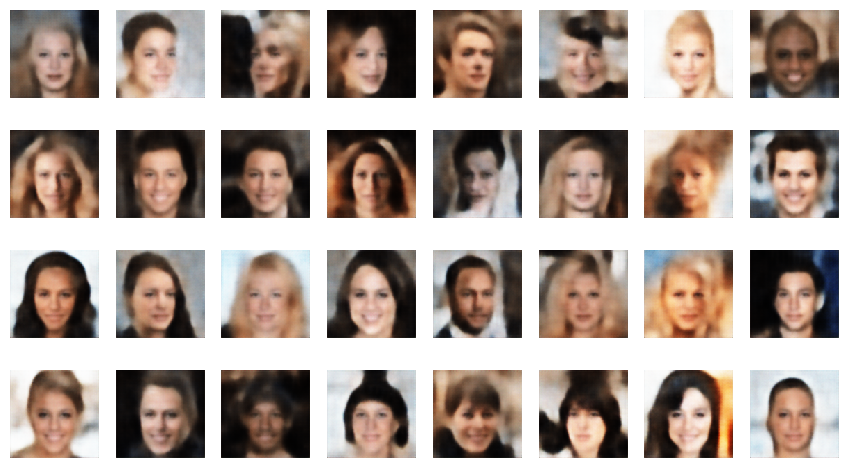

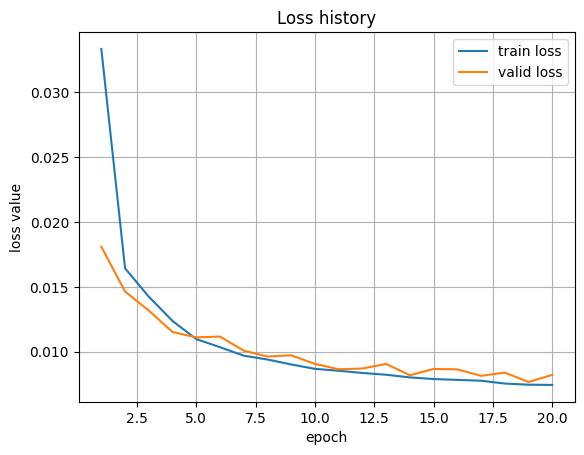

In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
from src.utils.visualizers import LossVisualizer
from src.utils.data_io import show_images
from src.utils.utility import save_checkpoint, load_checkpoint
import shutil

# ./temp ディレクトリの中身を削除
if os.path.exists('./temp/'):
    shutil.rmtree('./temp/')
    os.makedirs('./temp/')

# エポック番号
INIT_EPOCH = 0 # 初期値
LAST_EPOCH = INIT_EPOCH + N_EPOCHS # 最終値

# ニューラルネットワークの作成
enc_model = FaceEncoder(C=C, H=H, W=W, N=N).to(DEVICE)
dec_model = FaceDecoder(C=C, H=H, W=W, N=N).to(DEVICE)

# 最適化アルゴリズムの指定（ここでは SGD でなく Adam を使用）
enc_optimizer = optim.Adam(enc_model.parameters(), eps=ADAM_EPS)
dec_optimizer = optim.Adam(dec_model.parameters(), eps=ADAM_EPS)

# 再開モードの場合は，前回チェックポイントから情報をロードして学習再開
if RESTART_MODE:
    INIT_EPOCH, LAST_EPOCH, enc_model, enc_optimizer = load_checkpoint(CHECKPOINT_EPOCH, CHECKPOINT_ENC_MODEL, CHECKPOINT_ENC_OPT, N_EPOCHS, enc_model, enc_optimizer)
    _, _, dec_model, dec_optimizer = load_checkpoint(CHECKPOINT_EPOCH, CHECKPOINT_DEC_MODEL, CHECKPOINT_DEC_OPT, N_EPOCHS, dec_model, dec_optimizer)
    print('')

# 損失関数
loss_func = nn.MSELoss() # 平均二乗誤差損失を使用（これが最適とは限らない．平均絶対誤差損失 nn.L1Loss() なども考えられる）

# 損失関数値を記録する準備
loss_viz = LossVisualizer(['train loss', 'valid loss'], init_epoch=INIT_EPOCH)

# 勾配降下法による繰り返し学習
for epoch in range(INIT_EPOCH, LAST_EPOCH):

    print('Epoch {0}:'.format(epoch + 1))

    # 学習
    enc_model.train()
    dec_model.train()
    sum_loss = 0
    for X in tqdm(train_dataloader):
        for param in enc_model.parameters():
            param.grad = None
        for param in dec_model.parameters():
            param.grad = None
        X = X.to(DEVICE)
        with torch.amp.autocast_mode.autocast(enabled=USE_AMP, device_type='cuda', dtype=FLOAT_DTYPE):
            Z = enc_model(X) # 入力画像 X を現在のエンコーダに入力し，特徴ベクトル Z を得る
            Y = dec_model(Z) # 特徴ベクトル Z を現在のデコーダに入力し，復元画像 Y を得る
            loss = loss_func(X, Y) # 損失関数の現在値を計算
            LOSS_SCALER.scale(loss).backward() # 誤差逆伝播法により，個々のパラメータに関する損失関数の勾配（偏微分）を計算
            LOSS_SCALER.step(enc_optimizer)
            LOSS_SCALER.update() # 勾配に沿ってパラメータの値を更新
            LOSS_SCALER.step(dec_optimizer)
            LOSS_SCALER.update() # 同上
            sum_loss += float(loss) * len(X)
    avg_loss = sum_loss / train_size
    loss_viz.add_value('train loss', avg_loss) # 訓練データに対する損失関数の値を記録
    print('train loss = {0:.6f}'.format(avg_loss))

    # 検証
    enc_model.eval()
    dec_model.eval()
    sum_loss = 0
    with torch.inference_mode():
        for X in tqdm(valid_dataloader):
            X = X.to(DEVICE)
            Z = enc_model(X)
            Y = dec_model(Z)
            loss = loss_func(X, Y)
            sum_loss += float(loss) * len(X)
    avg_loss = sum_loss / valid_size
    loss_viz.add_value('valid loss', avg_loss) # 検証用データに対する損失関数の値を記録
    print('valid loss = {0:.6f}'.format(avg_loss))
    print('')

    # 学習経過の表示
    if epoch == 0:
        show_images(X.to('cpu').detach(), num=BATCH_SIZE, num_per_row=8, title='original', save_fig=False, save_dir=MODEL_DIR)
    show_images(Y.to('cpu').detach(), num=BATCH_SIZE, num_per_row=8, title='epoch {0}'.format(epoch + 1), save_fig=False, save_dir=MODEL_DIR)

    # 現在の学習状態を一時ファイル（チェックポイント）に保存
    save_checkpoint(CHECKPOINT_EPOCH, CHECKPOINT_ENC_MODEL, CHECKPOINT_ENC_OPT, epoch+1, enc_model, enc_optimizer)
    save_checkpoint(CHECKPOINT_EPOCH, CHECKPOINT_DEC_MODEL, CHECKPOINT_DEC_OPT, epoch+1, dec_model, dec_optimizer)

# 学習結果のニューラルネットワークモデルをファイルに保存
enc_model = enc_model.to('cpu')
dec_model = dec_model.to('cpu')
torch.save(enc_model.state_dict(), MODEL_FILE_ENC)
torch.save(dec_model.state_dict(), MODEL_FILE_DEC)

# 損失関数の記録をファイルに保存
loss_viz.save(v_file=os.path.join(MODEL_DIR, f'{N}_loss_graph.png'), h_file=os.path.join(MODEL_DIR, f'{N}_loss_history.csv'))

##### 学習済みニューラルネットワークモデルのロード

In [ ]:
import torch


# ニューラルネットワークモデルとその学習済みパラメータをファイルからロード
dec_model = FaceDecoder(C=C, H=H, W=W, N=N)
dec_model.load_state_dict(torch.load(MODEL_FILE_DEC, weights_only=True))

##### テスト処理
- 正規分布に従ってランダムサンプリングした乱数をデコーダに通して画像を生成

In [ ]:
import torch
from src.utils.data_io import show_images


dec_model = dec_model.to(DEVICE)
dec_model.eval()

# 生成する画像の枚数
n_gen = 32

# 正規分布 N(Z_mu, Z_sigma^2) に従って適当に乱数ベクトルを作成（ Z_mu == 0, Z_sigma == 1 なら標準正規分布 ）
Z_mu = 0 # 正規分布の平均
Z_sigma = 50 # 正規分布の標準偏差
Z = Z_sigma * torch.randn((n_gen, N)).to(DEVICE) + Z_mu

# 乱数ベクトルをデコーダに入力し，その結果を表示
with torch.inference_mode():
    Y = dec_model(Z)
    show_images(Y.to('cpu').detach(), num=n_gen, num_per_row=8, title='AE_sample_Face_generated', save_fig=True)